<a href="https://colab.research.google.com/github/mdpw/msc-ai-cw/blob/main/full_eda.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# 1. Load the dataset
file_path = "G:/My Drive/github/msc-ai-cw/dataset/processed/cinnamon_quality_dataset.csv"  # Use raw content URL
df = pd.read_csv(file_path)

In [3]:
# 2. Basic information
print("Dataset Shape:", df.shape)
print("\nDataset Info:")
print(df.info())
print("\nFirst 5 rows:")
print(df.head())

Dataset Shape: (8692, 14)

Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8692 entries, 0 to 8691
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Sample_ID           8692 non-null   object 
 1   Moisture            8681 non-null   float64
 2   Ash                 8685 non-null   float64
 3   Volatile_Oil        8686 non-null   float64
 4   Acid_Insoluble_Ash  8686 non-null   float64
 5   Chromium            8687 non-null   float64
 6   Coumarin            8690 non-null   float64
 7   Fiber               8687 non-null   float64
 8   Density             8689 non-null   float64
 9   Oil_Content         8683 non-null   float64
 10  Resin               8686 non-null   float64
 11  Pesticide_Level     8684 non-null   float64
 12  PH_Value            8690 non-null   float64
 13  Quality_Label       8692 non-null   object 
dtypes: float64(12), object(2)
memory usage: 950.8+ KB
None

First 5

In [4]:
# 3. Basic statistics
print("\nDescriptive Statistics:")
print(df.describe())


Descriptive Statistics:
          Moisture          Ash  Volatile_Oil  Acid_Insoluble_Ash  \
count  8681.000000  8685.000000   8686.000000         8686.000000   
mean      6.007677     1.498355      2.247403            0.548374   
std       1.163319     0.288383      0.718953            0.260506   
min       4.000600     1.000200      1.000100            0.100100   
25%       4.993300     1.247300      1.622525            0.323400   
50%       6.011000     1.501900      2.241300            0.546150   
75%       7.022600     1.746300      2.873100            0.777300   
max       7.999700     1.999600      3.499900            0.999900   

          Chromium     Coumarin        Fiber      Density  Oil_Content  \
count  8687.000000  8690.000000  8687.000000  8689.000000  8683.000000   
mean      0.275723     0.299694    15.005729     0.848752     9.984917   
std       0.129941     0.114632     2.872710     0.201377     2.881747   
min       0.050100     0.100100    10.003100     0.500100

In [5]:
# 4. Check for missing values
print("\nMissing Values:")
print(df.isnull().sum())


Missing Values:
Sample_ID              0
Moisture              11
Ash                    7
Volatile_Oil           6
Acid_Insoluble_Ash     6
Chromium               5
Coumarin               2
Fiber                  5
Density                3
Oil_Content            9
Resin                  6
Pesticide_Level        8
PH_Value               2
Quality_Label          0
dtype: int64


In [6]:
# Remove text after first space in column names
df.columns = [col.split(' ')[0] for col in df.columns]


Target Distribution:
Quality_Label
High      2944
Medium    2889
Low       2859
Name: count, dtype: int64


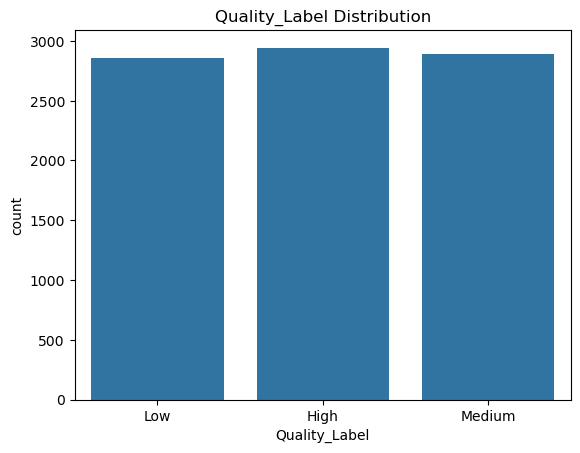

In [7]:
# 5. Class distribution (Quality_Label)
print("\nTarget Distribution:")
print(df['Quality_Label'].value_counts())
sns.countplot(x='Quality_Label', data=df)
plt.title('Quality_Label Distribution')
plt.show()

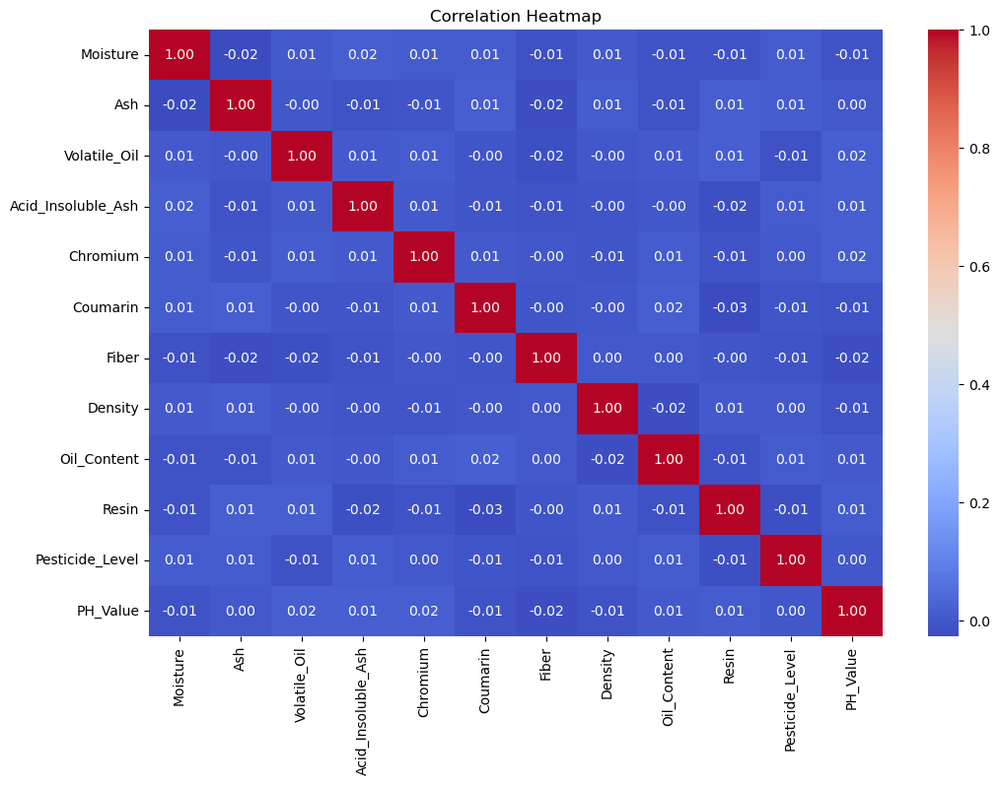

In [8]:
# 6. Correlation Matrix (Numerical Features Only)
numeric_df = df.select_dtypes(include=[np.number])
corr_matrix = numeric_df.corr()

# Plot Correlation Heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

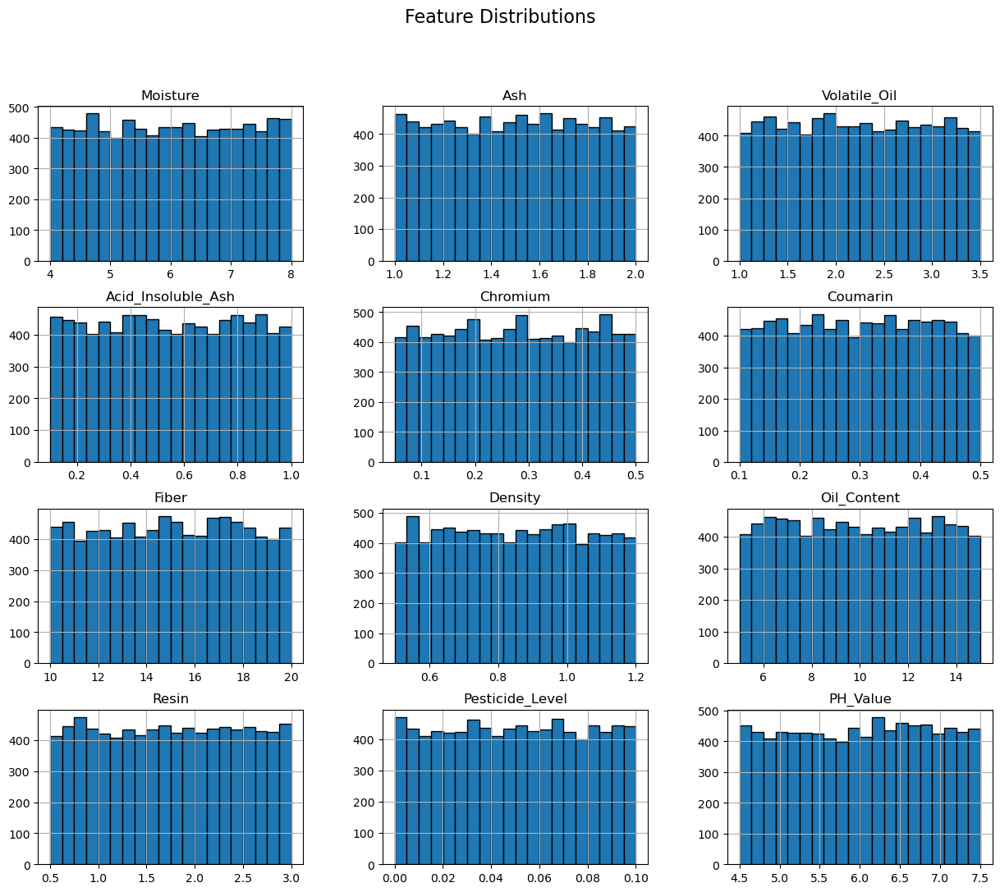

In [9]:
# 7. Distribution of each numerical feature
numeric_cols = numeric_df.columns
df[numeric_cols].hist(bins=20, figsize=(15, 12), edgecolor='black')
plt.suptitle('Feature Distributions', fontsize=16)
plt.show()

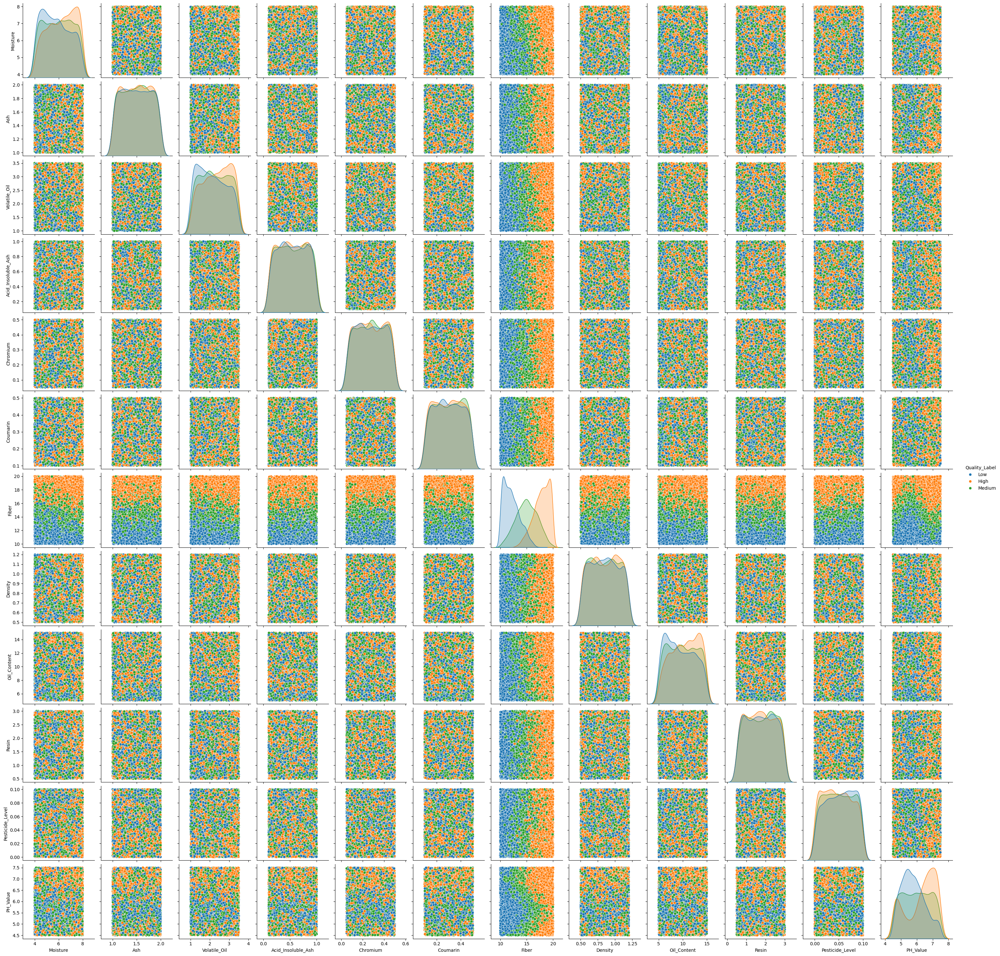

In [10]:
sns.pairplot(data=df,hue='Quality_Label')

In [ ]:
df.to_csv('../dataset/processed/modified_cinnamon_quality_dataset.csv', index=False)